# **Stage Juin 2023 - Equipe NeOpTo**
_Alexandre Lainé et [Laurent U. Perrinet](https://laurentperrinet.github.io/)_

Ce travail se repose en partie sur le travail réalisé pour l'[article](https://www.nature.com/articles/s42003-023-05042-3) de [Hugo Ladret](https://hugoladret.github.io/) et coll. publié dans la revue "Nature Communications Biology". Ci-dessous, se trouve mon travail résumé dans un [poster](https://github.com/alexandre-laine/2023-INT-StageM1/blob/main/Poster_LAINE_Alexandre_NeuroMarseille_Day_2023.pdf) que j'ai présenté lors de la journée [NeuroMarseille 2023](https://neuro-marseille.org/events/journee-neuromarseille-2023/).

In [1]:
#Importation des modules importants
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import scipy.stats as sst
import scipy.special as ss

import params as prm
import utils_introduction as ut_int

from joblib import Parallel, delayed

from sklearn import preprocessing 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

from tqdm import tqdm

import wasend as ws
import time

import os

In [2]:
# Paramètres utilisés
path = os.getcwd()
timesteps = np.arange(-.2, .4, .01)
cluster_all = np.load(os.path.join(path, "data", "paper_2023_postprocess", "cluster_list.npy"), allow_pickle = True)
winsize = .1
DATA_type = ["origin","equalize","erfinv"]
type_decod = ["decod_theta", "decod_btheta", "decod_combinaison"]

# Fonction d'Hugo Ladret (Nature Communication Biology, 2022)
def load_neuron_data(cluster_path):
    spiketimes = np.load(prm.grouping_path + cluster_path + '/spiketimes.npy', allow_pickle = True)
    spiketimes = spiketimes / prm.fs
    seq_contents = np.load(prm.grouping_path + cluster_path + '/sequences_contents.npy', allow_pickle = True)

    return {'cluster_path' : cluster_path,
            'spiketimes' : spiketimes,
            'seq_contents' : seq_contents} 

def filter_neuron_data(data,
                    data_type, target_btheta, target_theta,
                    min_t, max_t):
    
    spiketimes = data['spiketimes']
    seq_contents = data['seq_contents']
    
    if data_type == 'one_bt':
        spikes = [len(np.where((spiketimes > (seq['sequence_beg'] / prm.fs) + min_t) &
                    (spiketimes < (seq['sequence_beg'] / prm.fs) + max_t))[0])
                    for seq in seq_contents
                    if seq['sequence_btheta'] == target_btheta]

    elif data_type == 'bt_decoding_one_t' :
        spikes = [len(np.where((spiketimes > (seq['sequence_beg'] / prm.fs) + min_t) &
                    (spiketimes < (seq['sequence_beg'] / prm.fs) + max_t))[0])
                    for seq in seq_contents
                    if seq['sequence_theta'] == target_theta]

    elif data_type in ['all_bt',  'all_t_bt', 'bt_decoding']:
        spikes = [len(np.where((spiketimes > (seq['sequence_beg'] / prm.fs) + min_t) &
                    (spiketimes < (seq['sequence_beg'] / prm.fs) + max_t))[0])
                    for seq in seq_contents]

    return {'cluster_path' : data['cluster_path'],
            'spikes' : spikes}

def par_load_data(timesteps, target_clusters,
                data_type, target_btheta, target_theta,
                disable_tqdm = False):
    
    # Load the data from the disk
    loaded_data = Parallel(n_jobs = -1)(delayed(load_neuron_data)(cluster_path) for cluster_path in tqdm(target_clusters, desc = 'Loading data', disable = disable_tqdm))
    
    # Filter the data to get correct timestep and spikes
    if data_type == 'one_bt' : # décode
        last_shape = 30*12
    elif data_type == 'bt_decoding' :
        last_shape = 30*8*12
    elif data_type == 'all_t_bt' :
        last_shape = 30*8*12 # TODO is this correct ?
    out_data = np.zeros((len(timesteps), len(target_clusters), last_shape))
    for it, timestep in tqdm(enumerate(timesteps), total = len(timesteps), desc = 'Filtering data', disable = disable_tqdm):
        max_t = timestep + prm.win_size
        min_t = timestep 
        
        filtered_data = Parallel(n_jobs = -1)(delayed(filter_neuron_data)(data,
                                                                        data_type, target_btheta, target_theta,
                                                                        min_t, max_t) for data in loaded_data)
        

        if np.asarray(filtered_data[0]['spikes']).shape[0] != last_shape:
            print('Warning: the number of reptitions %s does not match last shape %s' %(np.asarray(filtered_data[0]['spikes']).shape, last_shape))
            
        # And reformat to array to follow the same ordering as target_clusters
        for ineuron, data in enumerate(filtered_data):
            idx_match = np.where(data['cluster_path'] == target_clusters)[0]
            out_data[it, idx_match] = data['spikes']
            
    out_data = np.swapaxes(out_data, 1, -1) # swap the reptition and neuron axis, otherwise bug
            
    # Now we get the labels, which is the easy part
    seq_contents_example = np.load(prm.grouping_path + target_clusters[0] + '/sequences_contents.npy', allow_pickle = True)
    if data_type == 'one_bt':
        labels = ['T%.3f'% seq['sequence_theta'] for seq in seq_contents_example
                if seq['sequence_btheta'] == target_btheta]

    elif data_type == 'all_t_bt':
        labels = ['BT%.3fT%.3f'%(seq['sequence_btheta'],seq['sequence_theta']) 
                for seq in seq_contents_example]

    elif data_type == 'bt_decoding' :
        labels = ['BT%.3f'% seq['sequence_btheta'] for seq in seq_contents_example]
        
    le = preprocessing.LabelEncoder()
    le.fit(labels)
    
    return out_data, le.transform(labels), le

# Charte graphique du poster
colors = ["black", "red", "purple"]
colors_fill = ["grey", "tomato", "violet"]
legends = ["firing rate", "probit", "logit"]

In [3]:
# Envoie de messages d'avancement => totalement facultatif
notif = False # Activation des messages d'avancement => True (Attention cela nécessite WhatsApp)
number = "33XXXXXXXXX" # Ajouter son numéro sous le format IINNNNNNNNN (I : identifiant, N : numéro)

Le principal travail a été d'implémenter une phase de préprocessing.
Dans celle-ci, on test des transformations non-linéaires afin de modifier la distribution des données. L'objectif étant d'améliorer le décodage en utilisant une distribution différente.

- Egalisation d'histogramme :
$$ z_i (\bar{a_i}) = P_i (a_i \leq \bar{a_i}) = \int^{\bar{a_i}}_{-\infty} dP_i(a_i) $$

- Fonction d'erreur inverse :
$$ z'_i = erf^{-1}(z) \quad erf(x) = \frac{2}{\sqrt{\pi}} \int^x_0 e^{-t^2}dt $$

In [4]:
# Transformaitons non-linéaires réalisées
def eq_hist(DATA=[]):
    
    print(f"mean FR = {DATA.mean()}")

    ni_max = DATA.max()
    nbr_bins = int(DATA.max() - 1)
    print(f"max FR = {ni_max}")

    # L'objectif de l'égalisation est de passer à une distribution uniforme allant de 0 à 1.
    # --- Calcul de la distribution des données

    value, bins = np.histogram(a=DATA, bins=nbr_bins,
                              range=(0,ni_max), density=True)
    bins_mid = 1/2 * (np.sum((bins[1:],bins[:-1]), axis=0))

    # --- Calcul de la courbe des probabilités cumulatives
    cumul_value = np.cumsum(value)

    # --- Interpolation des données par la courbe des probabilités cumulatives
    DATA_eq = np.interp(x=DATA, xp=bins[:-1], fp=cumul_value)

    print(f"mean FR_eq = {DATA_eq.mean()}")

    return DATA_eq

def erfinv(DATA=[]):
    
    # L'objectif de la fonction d'erreur inverse est de passer à une distribution plus normale allant de -1 à 1.
    DATA_erfinv = ss.erfinv(2*DATA-1)

    print(f"mean FR_erfinv = {DATA_erfinv.mean()}")
    
    return DATA_erfinv


## _Poster_

Introduction :


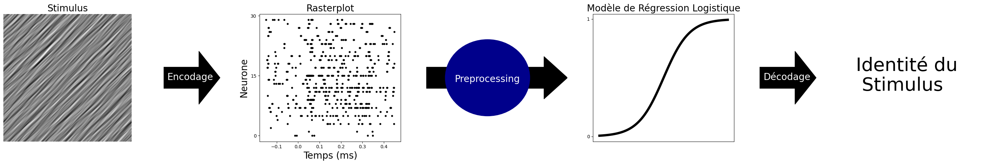

Matériel et méthodes :
--- Egalisation d'histogramme :


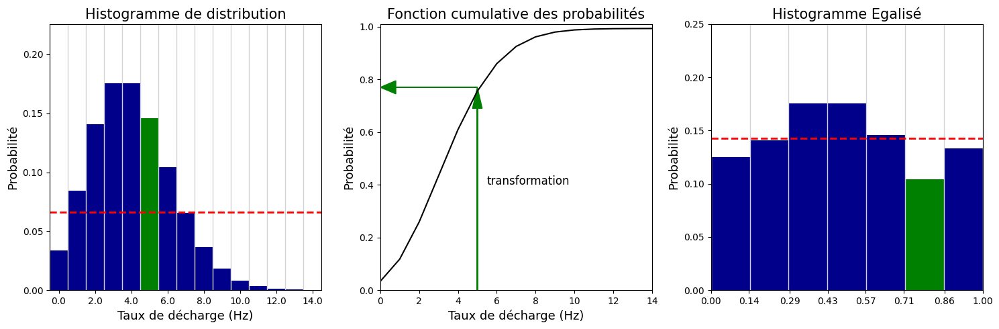

--- Fonction d'erreur inverse :
[     0 140574 175170 175636 146020 104309  65391]


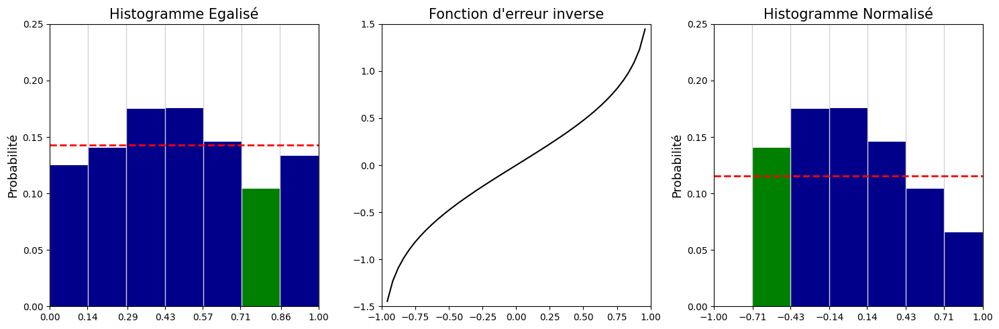

Résultats :
--- Décodage de l'orientation :


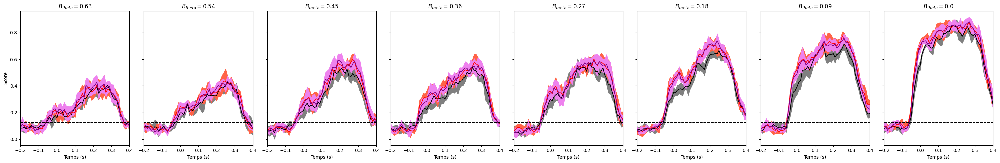

--- Décodage de la variabilité :


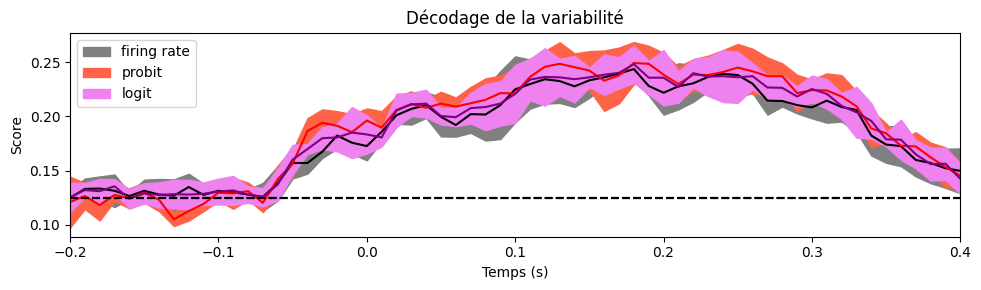

--- Décodage de la combinaison :


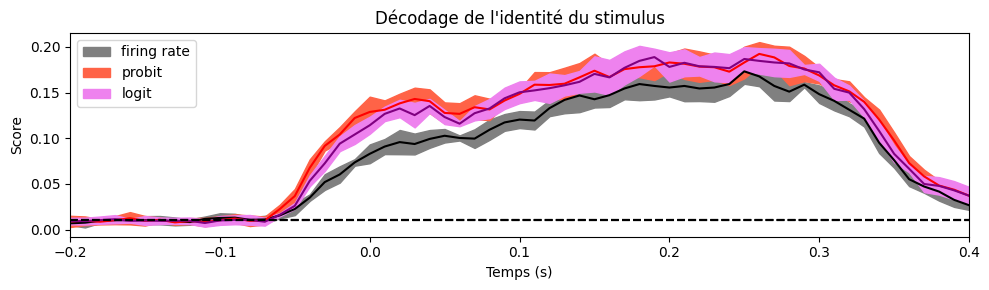

In [36]:
def graph_poster():
    # Introduction
    print("Introduction :")
    fig, ax = plt.subplots(1, 7, figsize=(30,5), gridspec_kw={'width_ratios':[1,0.5,1,1,1,0.5,1]})
    
    #### Stimulus
    img = ut_int.generate_cloud(theta=np.pi/4, b_theta=0.1, phase=0,
                                N_X=512, N_Y=512, seed=42, contrast=2.)
    ####
    ax[0].imshow(img, cmap='gray', interpolation='bilinear')
    ax[0].set_axis_off()
    ax[0].set_title("Stimulus", size=20)

    ####
    ax[1].arrow(x=0, y=0, dx=10, dy=0, width=1, length_includes_head=False,
                head_width=2.5, head_length=6, color="black")
    ax[1].text(x=1, y=-0.1, s="Encodage", color="white", size=20)
    ax[1].set_ylim(-3, 3)
    ax[1].set_xlim(0,20)
    ax[1].set_axis_off()

    #### Rasterplot
    load_folder = '%s/%s' % (prm.grouping_path, prm.ex_neurons[6])
    nm_PSTH_list = np.load(load_folder + '/PSTH.npy', allow_pickle=True)
    nm_PSTH_list = np.flip(nm_PSTH_list, axis=0)
    theta = nm_PSTH_list[0, 0, :]

    ####
    for it_1, trial in enumerate(theta):
        ax[2].scatter(trial, np.full_like(trial, it_1), s=10, color="black")
    ax[2].set_title("Rasterplot", size=20)
    ax[2].set_xlabel("Temps (ms)", size=20)
    ax[2].set_ylabel("Neurone", size=20)
    ax[2].set_yticks([0,15,30])

    ####
    Cercle = mpatches.Circle((-0.2,0), 0.9)
    Cercle.set(color="darkblue")

    ####
    ax[3].arrow(x=-1.5, y=0, dx=2.5, dy=0, width=0.5, length_includes_head=False,
                head_width=1, head_length=0.5, color="black")
    ax[3].add_artist(Cercle)
    ax[3].set_xlim(-1.5, 1.5)
    ax[3].set_ylim(-1.5, 1.5)
    ax[3].text(x=-0.9, y=-0.1, s="Preprocessing", color="white", size=20)
    ax[3].set_axis_off()

    #### Modèle de Régression Logistique
    X = np.linspace(-5,5,100)
    Y = ss.expit(X)

    ####
    ax[4].plot(X, Y, color="black", linewidth=5)
    ax[4].set_xticks([])
    ax[4].set_yticks([0,1])
    ax[4].set_title("Modèle de Régression Logistique", size=20)

    ####
    ax[5].arrow(x=0, y=0, dx=10, dy=0, width=1, length_includes_head=False,
                head_width=2.5, head_length=6, color="black")
    ax[5].text(x=1, y=-0.1, s="Décodage", color="white", size=20)
    ax[5].set_ylim(-3, 3)
    ax[5].set_xlim(0,20)
    ax[5].set_axis_off()

    ####
    ax[6].text(x=0, y=0.1, s="""Identité du""", size=40)
    ax[6].text(x=0, y=-0.2, s=""" Stimulus""", size=40)
    ax[6].set_ylim(-1, 1)
    ax[6].set_xlim(0, 1)
    ax[6].set_axis_off()
    
    plt.tight_layout()
    plt.show()
    
    # Matériel et Méthodes
    print("Matériel et méthodes :")
        # Equalisation d'histogramme
    print("--- Egalisation d'histogramme :")

    ####
    fig, ax = plt.subplots(1, 3, figsize=(15,5))
    data = sst.poisson.rvs(mu=5, loc=-1, size=1000000)
    
    #### Distribution d'origine
    value, bin = np.histogram(data, bins=15, range=(0,15))
    bin_mid = 1/2 * (np.sum((bin[1:], bin[:-1]), axis=0))

    ####
    ax[0].bar(x=bin_mid, height=value/len(data), width=15/len(bin_mid), color="darkblue")
    ax[0].bar(x=bin_mid[5], height=value[5]/len(data), width=15/len(bin_mid), color="green")
    ax[0].vlines(x=[x for x in bin],ymin=0, ymax=1, color="lightgrey", lw=1)
    ax[0].hlines(np.mean(value/len(data)), bin.min(), bin.max(), color="red",
                 linestyle="dashed", linewidth=2)
    ax[0].set_xticks(bin_mid[::2], bin[:-1:2])
    ax[0].set_xlim(bin.min(), bin.max())
    ax[0].set_ylim(0, (value/len(data)).max()+0.05)
    ax[0].set_ylabel("Probabilité", size=13)
    ax[0].set_xlabel("Taux de décharge (Hz)", size=13)
    ax[0].set_title("Histogramme de distribution", size=15)

    #### Transformation
    ax[1].plot(np.cumsum(value/len(data)), color="black")
    ax[1].set_xlim(0, 14)
    ax[1].set_ylim(0, 1.01)
    ax[1].set_ylabel("Probabilité", size=13)
    ax[1].set_xlabel("Taux de décharge (Hz)", size=13)
    ax[1].set_title("Fonction cumulative des probabilités", size=15)
    ax[1].arrow(x=5, y=0, dx=0, dy=0.69, width=0.05, length_includes_head=False,
                    head_width=0.5, head_length=0.08, color="green")
    ax[1].arrow(x=5, y=0.69+0.08, dx=-4.2, dy=0, width=0.001, length_includes_head=False,
                    head_width=0.05, head_length=0.8, color="green")
    ax[1].text(x=5.5, y=0.4, s="transformation", size=12)

    #### Distribution finale
    cumul_value = np.cumsum(value/len(data))
    data_eq = np.interp(x=data, xp=bin_mid, fp=cumul_value)
    value_eq, bin_eq = np.histogram(data_eq, bins=7, range=(0,1))
    bin_mid_eq = 1/2 * (np.sum((bin_eq[1:], bin_eq[:-1]), axis=0))

    ####
    ax[2].bar(x=bin_mid_eq, height=value_eq/len(data), width=1/len(bin_mid_eq), color="darkblue")
    ax[2].bar(x=bin_mid_eq[5], height=value_eq[5]/len(data), width=1/len(bin_mid_eq), color="green")
    ax[2].vlines(x=[x for x in bin_eq], ymin=0, ymax=1.1, color="lightgrey", lw=1)
    ax[2].hlines(np.mean((value_eq/np.cumsum(value_eq).max())), bin_eq.min(), bin_eq.max(),
                 color="red", linestyle="dashed", linewidth=2)
    ax[2].set_xticks([round(x, 2) for x in bin_eq])
    ax[2].set_xlim(bin_eq.min(),bin_eq.max())
    ax[2].set_ylim(0, 0.25)
    ax[2].set_ylabel("Probabilité", size=13)
    ax[2].set_title("Histogramme Egalisé", size=15)

    plt.tight_layout()
    plt.show()

        # Fonction d'erreur inverse
    print("--- Fonction d'erreur inverse :")

    ####
    fig, ax = plt.subplots(1, 3, figsize=(15,5))
    
    #### Distribution d'origine
    ax[0].bar(x=bin_mid_eq, height=value_eq/len(data), width=1/len(bin_mid_eq), color="darkblue")
    ax[0].bar(x=bin_mid_eq[5], height=value_eq[5]/len(data), width=1/len(bin_mid_eq), color="green")
    ax[0].vlines(x=[x for x in bin_eq], ymin=0, ymax=1.1, color="lightgrey", lw=1)
    ax[0].hlines(np.mean((value_eq/np.cumsum(value_eq).max())), bin_eq.min(), bin_eq.max(),
                 color="red", linestyle="dashed", linewidth=2)
    ax[0].set_xticks([round(x, 2) for x in bin_eq])
    ax[0].set_xlim(bin_eq.min(),bin_eq.max())
    ax[0].set_ylim(0, 0.25)
    ax[0].set_ylabel("Probabilité", size=13)
    ax[0].set_title("Histogramme Egalisé", size=15)

    #### Transformation
    x = np.linspace(-1, 1)
    y = ss.erfinv(x)
    
    ####
    ax[1].plot(x, y, color="black")
    ax[1].set_xlim(-1, 1)
    ax[1].set_ylim(-1.5, 1.5)
    ax[1].set_title("Fonction d'erreur inverse", size=15)
    
    #### Distribution finale
    data_erfinv =  ss.erfinv(2*data_eq-1)
    value_erfinv, bin_erfinv = np.histogram(data_erfinv, bins=7, range=(-1,1))
    bin_mid_erfinv = 1/2 * (np.sum((bin_erfinv[1:], bin_erfinv[:-1]), axis=0))
    print(value_erfinv)

    ####
    ax[2].bar(x=bin_mid_erfinv, height=value_erfinv/len(data), width=2/7, color="darkblue")
    ax[2].bar(x=bin_mid_erfinv[1], height=value_erfinv[1]/len(data), width=2/7, color="green")
    ax[2].vlines(x=[x for x in bin_erfinv], ymin=0, ymax=1.1, color="lightgrey", lw=1)
    ax[2].hlines(np.mean(value_erfinv/len(data)), bin_erfinv.min(), bin_erfinv.max(),
                 color="red", linestyle="dashed", linewidth=2)
    ax[2].set_xticks([round(x, 2) for x in bin_erfinv])
    ax[2].set_xlim(bin_erfinv.min(), bin_erfinv.max())
    ax[2].set_ylim(0, 0.25)
    ax[2].set_ylabel("Probabilité", size=13)
    ax[2].set_title("Histogramme Normalisé", size=15)

    plt.tight_layout()
    plt.show()

    # Résultats
    print("Résultats :")
        # Décodage de l'orientation
    print("--- Décodage de l'orientation :")

    ####
    fig, ax = plt.subplots(1, 8, figsize=(30,5), sharex=True, sharey=True)
    for j, TYPE in enumerate(["origin", "equalize", "erfinv"]):
        mean = np.load(path+f"\data\Stage\decod_theta\{TYPE}\Score_mean.npy")
        sd = np.load(path+f"\data\Stage\decod_theta\{TYPE}\Score_sd.npy")

        ####
        for i in range(8):
            ax[i].fill_between(timesteps, mean[:,i]-sd[:,i], mean[:,i]+sd[:,i],
                               color=colors_fill[j], label=legends[j])
            ax[i].plot(timesteps, mean[:,i], color=colors[j])
            ax[i].set_xlim(timesteps.min(), timesteps.max())
            ax[i].hlines(y=1/8, xmin=timesteps.min(), xmax=timesteps.max(),
                         color="black", linestyle="dashed")
            ax[i].set_xlabel("Temps (s)")
            ax[i].set_title(r"$B_{theta} =$"+str(round(prm.B_thetas[i], 2)))
    ax[0].set_ylabel("Score")

    plt.tight_layout()
    plt.show()

        # Décodage de la variabilité
    print("--- Décodage de la variabilité :")
    
    ####
    fig, ax = plt.subplots(1, 1, figsize=(10,3))
    
    for j, TYPE in enumerate(["origin", "equalize", "erfinv"]):
        mean = np.load(path+f"\data\Stage\decod_btheta\{TYPE}\Score_mean.npy")
        sd = np.load(path+f"\data\Stage\decod_btheta\{TYPE}\Score_sd.npy")
        
        ####
        ax.fill_between(timesteps, mean-sd, mean+sd, color=colors_fill[j], label=legends[j])
        ax.plot(timesteps, mean, color=colors[j])
        ax.set_xlim(timesteps.min(), timesteps.max())
        ax.hlines(1/8, timesteps.min(), timesteps.max(), color="black", linestyle="dashed")
        ax.set_title("Décodage de la variabilité")
        ax.set_xlabel("Temps (s)")
        ax.set_ylabel("Score")
    
    plt.legend()
    plt.tight_layout()
    plt.show()

        # Décodage de la combinaison
    print("--- Décodage de la combinaison :")

    ####
    fig, ax = plt.subplots(1, 1, figsize=(10,3))

    for j, TYPE in enumerate(["origin", "equalize", "erfinv"]):
        mean = np.load(path+f"\data\Stage\decod_combinaison\{TYPE}\Score_mean.npy")
        sd = np.load(path+f"\data\Stage\decod_combinaison\{TYPE}\Score_sd.npy")
        
        ####
        ax.fill_between(timesteps, mean-sd, mean+sd, color=colors_fill[j], label=legends[j])
        ax.plot(timesteps, mean, color=colors[j])
        ax.set_xlim(timesteps.min(), timesteps.max())
        ax.hlines(1/(8*12), timesteps.min(), timesteps.max(), color="black", linestyle="dashed")
        ax.set_title("Décodage de l'identité du stimulus")
        ax.set_xlabel("Temps (s)")
        ax.set_ylabel("Score")

    plt.legend()
    plt.tight_layout()
    plt.show()

graph_poster()

## Decoding de l'orientation ($\theta$)

In [147]:
# Le stimulus présenté peut prendre 8 orientations (theta) possible.
# On tente de décoder cette orientation pour chaque niveau de variabilité (B_theta).

cluster_decod = cluster_all

# Chargement des données
DATA = np.zeros((len(prm.B_thetas), 61, 360, len(cluster_decod)))
LABELS = np.zeros((len(prm.B_thetas), 360))
for i,bt in enumerate(prm.B_thetas) :
    print("btheta = "+str(round(bt,2)))
    DATA[i,:,:,:], LABELS[i,:],_ = par_load_data(timesteps=timesteps, target_clusters=cluster_decod,target_btheta=bt, target_theta=None, data_type="one_bt")

# Sauvegarde des données
#np.save(path+"\data\Stage\decod_theta\\raw_data\Data", DATA)
#np.save(path+"\data\Stage\decod_theta\\raw_data\Labels", LABELS)

if notif == True :
    date = time.ctime()
    ws.send(date+"// chargement theta ok !", number)

btheta = 0.63


Filtering data: 100%|██████████| 61/61 [04:02<00:00,  3.98s/it]


btheta = 0.54


Filtering data: 100%|██████████| 61/61 [04:03<00:00,  4.00s/it]


btheta = 0.45


Filtering data: 100%|██████████| 61/61 [04:02<00:00,  3.97s/it]


btheta = 0.36


Filtering data: 100%|██████████| 61/61 [04:03<00:00,  3.99s/it]


btheta = 0.27


Filtering data: 100%|██████████| 61/61 [04:03<00:00,  3.98s/it]


btheta = 0.18


Filtering data: 100%|██████████| 61/61 [04:03<00:00,  4.00s/it]


btheta = 0.09


Filtering data: 100%|██████████| 61/61 [04:02<00:00,  3.98s/it]


btheta = 0.0


Filtering data: 100%|██████████| 61/61 [04:03<00:00,  3.99s/it]


In [148]:
# Transformation non-linéaire des données
# --- Egalisation d'histogramme
DATA_eq = np.zeros_like(DATA)

# --- Fonction d'erreur inverse
DATA_erfinv = np.zeros_like(DATA)

for i in range(len(prm.B_thetas)):
    print(f"B_theta = {prm.B_thetas[i]}")
    # Egalisation d"histogramme
    DATA_eq[i,:,:,:] = eq_hist(DATA=DATA[i,:,:,:])

    # Fonction d'erreur inverse
    DATA_erfinv[i,:,:,:] = erfinv(DATA=DATA_eq[i,:,:,:])

#np.save(path+"\data\Stage\decod_theta\\raw_data\Data_eq", DATA_eq)
#np.save(path+"\data\Stage\decod_theta\\raw_data\Data_erfinv", DATA_erfinv)

B_theta = 0.6283185307179586
mean FR = 0.8171128960285586
max FR = 49.0
mean FR_eq = 0.8407850930650611
mean FR_erfinv = 0.7284088606960041
B_theta = 0.5385587406153931
mean FR = 0.8340076151600939
max FR = 80.0
mean FR_eq = 0.8464127962201529
mean FR_erfinv = 0.7493251554741102
B_theta = 0.4487989505128276
mean FR = 0.8386037775875816
max FR = 53.0
mean FR_eq = 0.8396657607879642
mean FR_erfinv = 0.7263291685272574
B_theta = 0.35903916041026207
mean FR = 0.8550195316786271
max FR = 48.0
mean FR_eq = 0.8360679361617621
mean FR_erfinv = 0.7152576171610665
B_theta = 0.26927937030769655
mean FR = 0.8576243041382287
max FR = 51.0
mean FR_eq = 0.8371228041584936
mean FR_erfinv = 0.7188282067654191
B_theta = 0.17951958020513104
mean FR = 0.871533675686352
max FR = 53.0
mean FR_eq = 0.8357461288997191
mean FR_erfinv = 0.7156465383473383
B_theta = 0.08975979010256552
mean FR = 0.8969186399514268
max FR = 60.0
mean FR_eq = 0.8356099130401945
mean FR_erfinv = 0.7165851489912597
B_theta = 0.0
mea

In [149]:
# Fonction réalisant le décoding en utilisant un modèle de régression logistique
def decodeur_theta(DATA=[], LABELS=[]):
    Scores_mean = np.zeros((61, len(prm.B_thetas)))
    Scores_sd = np.zeros((61, len(prm.B_thetas)))
    for j in range(len(prm.B_thetas)):
        print("btheta = "+str(round(prm.B_thetas[j],2)))
        data = DATA[j,:,:,:]
        labels = LABELS[j,:]
        scores = np.zeros((len(prm.timesteps),prm.n_splits))
        logreg = LogisticRegression(**prm.opts_LR)
        for i in tqdm(range(data.shape[0]), desc = 'Decoding'):
            scores[i,:] = cross_val_score(logreg, data[i,:,:], labels, cv = prm.n_splits,
                                          scoring = 'balanced_accuracy')
        Scores_mean[:,j] = scores.mean(axis=-1)
        Scores_sd[:,j] = scores.std(axis=-1)
    return Scores_mean, Scores_sd

In [150]:
# Réalisation du décoding pour les trois distributions
for i, x in enumerate([DATA, DATA_eq, DATA_erfinv]):
    print(DATA_type[i])
    Score_mean, Score_sd = decodeur_theta(DATA=x, LABELS=LABELS)
    #np.save(path+f"\data\Stage\decod_theta\{DATA_type[i]}\Score_mean", Score_mean)
    #np.save(path+f"\data\Stage\decod_theta\{DATA_type[i]}\Score_sd", Score_sd)

if notif == True :
    date = time.ctime()
    ws.send(date+"// decodage theta ok !", number)

origin
btheta = 0.63


Decoding:   0%|          | 0/61 [00:00<?, ?it/s]

Decoding: 100%|██████████| 61/61 [00:36<00:00,  1.69it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:31<00:00,  1.91it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:33<00:00,  1.82it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:31<00:00,  1.93it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:34<00:00,  1.76it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:37<00:00,  1.61it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:35<00:00,  1.71it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:34<00:00,  1.75it/s]


equalize
btheta = 0.63


Decoding: 100%|██████████| 61/61 [00:13<00:00,  4.46it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:14<00:00,  4.36it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:13<00:00,  4.36it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:15<00:00,  4.06it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:14<00:00,  4.11it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:15<00:00,  3.92it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:16<00:00,  3.77it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


erfinv
btheta = 0.63


Decoding: 100%|██████████| 61/61 [00:24<00:00,  2.45it/s]


btheta = 0.54


Decoding: 100%|██████████| 61/61 [00:28<00:00,  2.14it/s]


btheta = 0.45


Decoding: 100%|██████████| 61/61 [00:25<00:00,  2.37it/s]


btheta = 0.36


Decoding: 100%|██████████| 61/61 [00:26<00:00,  2.32it/s]


btheta = 0.27


Decoding: 100%|██████████| 61/61 [00:28<00:00,  2.15it/s]


btheta = 0.18


Decoding: 100%|██████████| 61/61 [00:30<00:00,  1.97it/s]


btheta = 0.09


Decoding: 100%|██████████| 61/61 [00:31<00:00,  1.96it/s]


btheta = 0.0


Decoding: 100%|██████████| 61/61 [00:28<00:00,  2.15it/s]


In [184]:
# Représentation graphique
fig, ax = plt.subplots(1, 8, figsize=(30,5), sharex=True, sharey=True)
fig.set_dpi(1000)
for i,x in enumerate(DATA_type):
    Score_mean = np.load(path+f"\data\Stage\decod_theta\{DATA_type[i]}\Score_mean.npy")
    Score_sd = np.load(path+f"\data\Stage\decod_theta\{DATA_type[i]}\Score_sd.npy")
    for j in range(len(prm.B_thetas)):
        ax[j].set_title(r"$B_\theta = $"+str(round(prm.B_thetas[j],2)))
        ax[j].fill_between(timesteps, Score_mean[:,j]-Score_sd[:,j], Score_mean[:,j]+Score_sd[:,j],
                           color=colors_fill[i])
        ax[j].plot(timesteps, Score_mean[:,j], color=colors[i], label=legends[i])
        ax[j].hlines(y=1/12, xmin=timesteps.min(), xmax=timesteps.max(),
                     color="black", linestyle="dashed", linewidth=2)
        ax[j].set_xticks(timesteps[::10],
                        [round(x,1) for x in np.linspace(-0.1, 0.5, len(timesteps[::10]))])
        ax[j].set_xlabel("Peristimulus time (s)")
ax[0].set_ylabel("Kfold score")
ax[0].set_xlim(timesteps.min(), timesteps.max())
ax[0].legend()
plt.tight_layout()
plt.savefig(path+f"\\figs\Stage\Decoding_theta")
plt.show()


## Decoding de la variabilité ($B_\theta$)

In [152]:
# Le stimulus présenté peut prendre 12 niveaux de variabilit ($\theta$) possible.
# On tente de décoder cette varibilité.

cluster_decod = cluster_all

# Chargement des données
DATA, LABELS, _ = par_load_data(timesteps=timesteps, target_clusters=cluster_decod,
                                target_btheta=None, target_theta=None, data_type="bt_decoding")

# Sauvegarde des données
#np.save(path+"\data\Stage\decod_btheta\\raw_data\Data", DATA)
#np.save(path+"\data\Stage\decod_btheta\\raw_data\Labels", LABELS)

if notif == True :
    date = time.ctime()
    ws.send(date+"// chargement b_theta ok !", number)

Filtering data: 100%|██████████| 61/61 [04:50<00:00,  4.77s/it]


In [153]:
# Transformation des données
# --- Egalisation d'histogramme
DATA_eq = eq_hist(DATA)

# --- Fonction d'erreur inverse
DATA_erfinv = erfinv(DATA_eq)

# Sauvegarde des données
#np.save(path+"\data\Stage\decod_btheta\\raw_data\Data_eq", DATA_eq)
#np.save(path+"\data\Stage\decod_btheta\\raw_data\Data_erfinv", DATA_erfinv)

mean FR = 0.8718462648407839
max FR = 80.0
mean FR_eq = 0.8417163927455045
mean FR_erfinv = 0.7364273389642539


In [154]:
# Fonction réalisant le décoding en utilisant un modèle de régression logistique
def decodeur(DATA=[], LABELS=[]):
    scores = np.zeros((len(prm.timesteps),prm.n_splits))
    logreg = LogisticRegression(**prm.opts_LR)
    for i in tqdm(range(DATA.shape[0]), desc = 'Decoding'):
        scores[i,:] = cross_val_score(logreg, DATA[i,:,:], LABELS, cv = prm.n_splits,
                                      scoring = 'balanced_accuracy')
    Scores_mean = scores.mean(axis=-1)
    Scores_sd = scores.std(axis=-1)
    return Scores_mean, Scores_sd

In [155]:
# Réalisation du décoding pour les trois distributions
for i, x in enumerate([DATA, DATA_eq, DATA_erfinv]):
    print(f"Data type : {DATA_type[i]}")
    Score_mean, Score_sd = decodeur(DATA=x, LABELS=LABELS)
    #np.save(path+f"\data\Stage\decod_btheta\{DATA_type[i]}\Score_mean", Score_mean)
    #np.save(path+f"\data\Stage\decod_btheta\{DATA_type[i]}\Score_sd", Score_sd)

if notif == True :
    date = time.ctime()
    ws.send(date+"// decodage b_theta ok !", number)

Data type : origin


Decoding: 100%|██████████| 61/61 [08:43<00:00,  8.58s/it]


Data type : equalize


Decoding: 100%|██████████| 61/61 [07:20<00:00,  7.23s/it]


Data type : erfinv


Decoding: 100%|██████████| 61/61 [09:34<00:00,  9.42s/it]


In [185]:
# Représentation graphique
fig, ax = plt.subplots(figsize=(15,5))
fig.set_dpi(1000)
for i,x in enumerate(DATA_type):
    Score_mean = np.load(path+f"\data\Stage\decod_btheta\{DATA_type[i]}\Score_mean.npy")
    Score_sd = np.load(path+f"\data\Stage\decod_btheta\{DATA_type[i]}\Score_sd.npy")
    ax.fill_between(timesteps, Score_mean-Score_sd, Score_mean+Score_sd,
                           color=colors_fill[i])
    ax.plot(timesteps, Score_mean, color=colors[i], label=legends[i])
    ax.hlines(y=1/8, xmin=timesteps.min(), xmax=timesteps.max(),
              color="black", linestyle="dashed", linewidth=2)
ax.set_xticks(timesteps[::10], [round(x,1) for x in np.linspace(-0.1, 0.5, len(timesteps[::10]))])
ax.set_xlim(timesteps.min(), timesteps.max())
ax.set_xlabel("Peristimulus time (s)")
ax.set_ylabel("Kfold score")
ax.legend()
plt.savefig(path+f"\\figs\Stage\Decoding_btheta")
plt.tight_layout()
plt.show()


## Décoding de l'identité du stimulus ($\theta X B_\theta$)

In [157]:
# Si on considère 8 orientations (theta) et 12 niveaux de variabilité (Btheta), cela donne 96 combinaisons.
# On tente de décoder la combinaison représentant l'identité du stimulus.

cluster_decod = cluster_all

# Chargement des données
DATA, LABELS, _ = par_load_data(timesteps=timesteps, target_clusters=cluster_decod,
                                target_btheta=None, target_theta=None, data_type="all_t_bt")

# Sauvegarde des données
#np.save(path+"\data\Stage\decod_combinaison\\raw_data\Data", DATA)
#np.save(path+"\data\Stage\decod_combinaison\\raw_data\Labels", LABELS)

if notif == True :
    date = time.ctime()
    ws.send(date+"// chargement bthetatheta ok !", number)

Filtering data: 100%|██████████| 61/61 [04:54<00:00,  4.82s/it]


In [158]:
# Transformation des données
# --- Egalisation d'histogramme
DATA_eq = eq_hist(DATA)

# --- Fonction d'erreur inverse
DATA_erfinv = erfinv(DATA_eq)

# Sauvegarde des données
#np.save(path+"\data\Stage\decod_combinaison\\raw_data\Data_eq", DATA_eq)
#np.save(path+"\data\Stage\decod_combinaison\\raw_data\Data_erfinv", DATA_erfinv)

mean FR = 0.8718462648407839
max FR = 80.0
mean FR_eq = 0.8417163927455045
mean FR_erfinv = 0.7364273389642539


In [159]:
# Réalisation du décoding pour les trois distributions
for i, x in enumerate([DATA, DATA_eq, DATA_erfinv]):
    print(f"Data type : {DATA_type[i]}")
    Score_mean, Score_sd = decodeur(DATA=x, LABELS=LABELS)
    #np.save(path+f"\data\Stage\decod_combinaison\{DATA_type[i]}\Score_mean", Score_mean)
    #np.save(path+f"\data\Stage\decod_combinaison\{DATA_type[i]}\Score_sd", Score_sd)

if notif == True :
    date = time.ctime()
    ws.send(date+"// décodage bthetatheta ok !", number)

Data type : origin


Decoding: 100%|██████████| 61/61 [37:53<00:00, 37.28s/it]


Data type : equalize


Decoding: 100%|██████████| 61/61 [11:35<00:00, 11.41s/it]


Data type : erfinv


Decoding: 100%|██████████| 61/61 [25:55<00:00, 25.50s/it]


In [186]:
# Représentation graphique
fig, ax = plt.subplots(figsize=(15,5))
fig.set_dpi(1000)
for i,x in enumerate(DATA_type):
    Score_mean = np.load(path+f"\data\Stage\decod_combinaison\{DATA_type[i]}\Score_mean.npy")
    Score_sd = np.load(path+f"\data\Stage\decod_combinaison\{DATA_type[i]}\Score_sd.npy")
    ax.fill_between(timesteps, Score_mean-Score_sd, Score_mean+Score_sd,
                    color=colors_fill[i])
    ax.plot(timesteps, Score_mean, color=colors[i], label=legends[i])
    ax.hlines(y=1/(8*12), xmin=timesteps.min(), xmax=timesteps.max(),
              color="black", linestyle="dashed", linewidth=2)
ax.set_xticks(timesteps[::10], [round(x,1) for x in np.linspace(-0.1, 0.5, len(timesteps[::10]))])
ax.set_xlim(timesteps.min(), timesteps.max())
ax.set_xlabel("Peristimulus time (s)")
ax.set_ylabel("Kfold score")
ax.legend()
plt.tight_layout()
plt.savefig(path+f"\\figs\Stage\Decoding_thetabtheta")
plt.show()